In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

# Путь к файлу на вашем Google Диске
file_path = '/content/drive/MyDrive/hotel_bookings.csv'
df = pd.read_csv(file_path)
print(df.head())

          hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  \
0  Resort Hotel            0        342               2015               July   
1  Resort Hotel            0        737               2015               July   
2  Resort Hotel            0          7               2015               July   
3  Resort Hotel            0         13               2015               July   
4  Resort Hotel            0         14               2015               July   

   arrival_date_week_number  arrival_date_day_of_month  \
0                        27                          1   
1                        27                          1   
2                        27                          1   
3                        27                          1   
4                        27                          1   

   stays_in_weekend_nights  stays_in_week_nights  adults  ...  deposit_type  \
0                        0                     0       2  ...    No Deposit   
1     

# ========================================================

# **Разведочный анализ данных c ydata-profiling**

In [ ]:
!pip install -U ydata-profiling

In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport

# Загружаем ваш CSV-файл
df = pd.read_csv('hotel_bookings.csv')

# Быстрый взгляд на данные (проверка, что всё загрузилось корректно)
print(df.shape)
df.head()

(119390, 32)


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
df = pd.read_csv('hotel_bookings.csv')

# Базовый отчет (может выполняться долго на больших данных)
profile = ProfileReport(df, title="Мой отчет по анализу данных")

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 32/32 [00:05<00:00,  5.40it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# ========================================================

# **Подготовка данных**

In [ ]:
import pandas as pd
import numpy as np

# Загружаем данные
df = pd.read_csv('hotel_bookings.csv', sep=',')

print("ДО ОБРАБОТКИ:")
print(f"Размер: {df.shape}")
print(f"Типы данных:\n{df.dtypes}")

# ============= ОБЯЗАТЕЛЬНЫЙ МИНИМУМ =============

# 1. Замена NULL на NaN
df = df.replace('NULL', pd.NA)

# 2. children -> int
df['children'] = pd.to_numeric(df['children'], errors='coerce').fillna(0).astype(int)

# 3. reservation_status_date -> datetime
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

# 4. is_canceled -> category
df['is_canceled'] = df['is_canceled'].astype('category')

# ============= ОПЦИОНАЛЬНАЯ ОБРАБОТКА =============

# 5. Проверка и удаление строк с 0 гостей
invalid_guests = (df['adults'] == 0) & (df['children'] == 0) & (df['babies'] == 0)
invalid_count = invalid_guests.sum()
if invalid_count > 0:
    df = df[~invalid_guests]
    print(f"\nУдалено строк с 0 гостей: {invalid_count}")

# 6. Обработка выбросов в adr (средняя цена)
# Используем метод IQR для обнаружения выбросов
Q1 = df['adr'].quantile(0.25)
Q3 = df['adr'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df[(df['adr'] < lower_bound) | (df['adr'] > upper_bound)]
print(f"Обнаружено выбросов в adr: {len(outliers)} ({len(outliers)/len(df)*100:.2f}%)")

# Ограничиваем выбросы (винсоризация)
df['adr'] = df['adr'].clip(lower_bound, upper_bound)
print(f"Выбросы в adr ограничены диапазоном [{lower_bound:.2f}, {upper_bound:.2f}]")

# 7. Заполнение пропусков в agent и company
# agent: заполняем 0 (означает "нет агента")
df['agent'] = pd.to_numeric(df['agent'], errors='coerce').fillna(0).astype(int)
# company: заполняем 0 (означает "нет компании")
df['company'] = pd.to_numeric(df['company'], errors='coerce').fillna(0).astype(int)

print("\n" + "="*50)
print("ИТОГОВЫЙ ОТЧЁТ:")
print("="*50)
print(f"Размер после очистки: {df.shape}")
print(f"\nПропуски после обработки:")
print(df.isnull().sum())
print(f"\nТипы данных:")
print(df.dtypes)

# Сохраняем подготовленный файл
df.to_csv('hotel_bookings_cleaned.csv', index=False, sep=';')
print("\n✅ Файл сохранён: hotel_bookings_cleaned.csv")

# Для Google Colab — скачиваем файл
from google.colab import files
files.download('hotel_bookings_cleaned.csv')

ДО ОБРАБОТКИ:
Размер: (119390, 32)
Типы данных:
hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# ========================================================

# **Кодирование признаков и моделирование**

Цель: Моделирование предрасположенности гостя к отмене бронирования в отеле

In [ ]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 5.0 MB/s eta 0:00:00


# Логистическая регрессия + Random Forest + XGBoost

Размер после кодирования: (95368, 45)

Обучение: Logistic Regression
Accuracy: 0.8068
Precision: 0.8034
Recall: 0.6342
F1-Score: 0.7088
ROC-AUC: 0.8818

Обучение: Random Forest
Accuracy: 0.8938
Precision: 0.8838
Recall: 0.8216
F1-Score: 0.8516
ROC-AUC: 0.9595

Обучение: XGBoost


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [08:03:08] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Accuracy: 0.8830
Precision: 0.8570
Recall: 0.8216
F1-Score: 0.8389
ROC-AUC: 0.9541

СРАВНЕНИЕ МОДЕЛЕЙ (по ROC-AUC):
              Model  Accuracy  Precision   Recall  F1-Score  ROC-AUC
      Random Forest  0.893801   0.883792 0.821606  0.851565 0.959484
            XGBoost  0.883022   0.856991 0.821606  0.838926 0.954096
Logistic Regression  0.806812   0.803382 0.634163  0.708813 0.881826


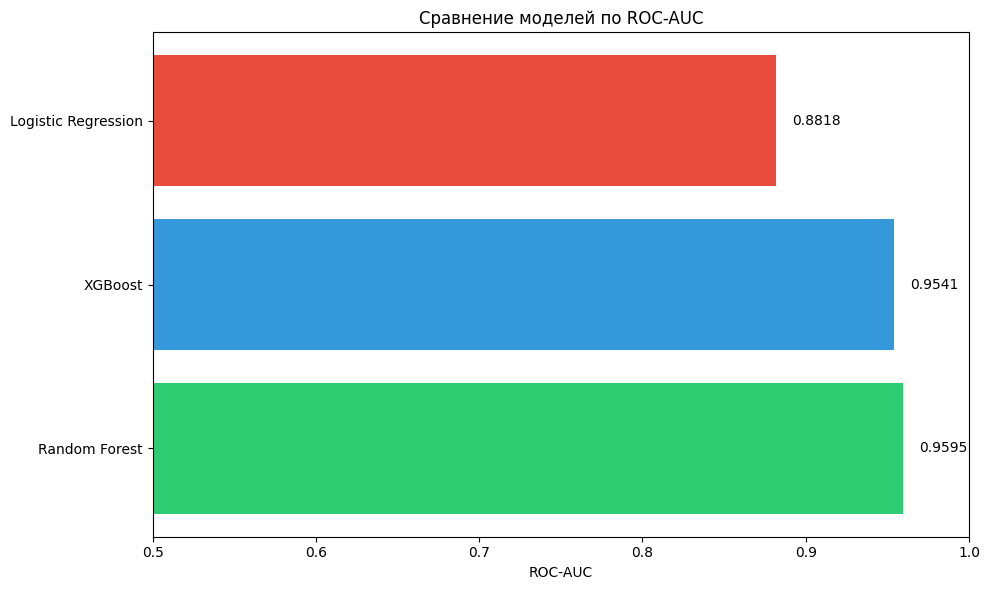


ДОВЕРИТЕЛЬНЫЕ ИНТЕРВАЛЫ ДЛЯ ROC-AUC (95%):

Logistic Regression:
  ROC-AUC: 0.8818
  95% ДИ: [0.8776, 0.8862]
  Ширина интервала: 0.0085

Random Forest:
  ROC-AUC: 0.9595
  95% ДИ: [0.9569, 0.9616]
  Ширина интервала: 0.0047

XGBoost:
  ROC-AUC: 0.9541
  95% ДИ: [0.9519, 0.9564]
  Ширина интервала: 0.0044

ROC-КРИВАЯ С ДОВЕРИТЕЛЬНЫМ ИНТЕРВАЛОМ (лучшая модель: Random Forest)


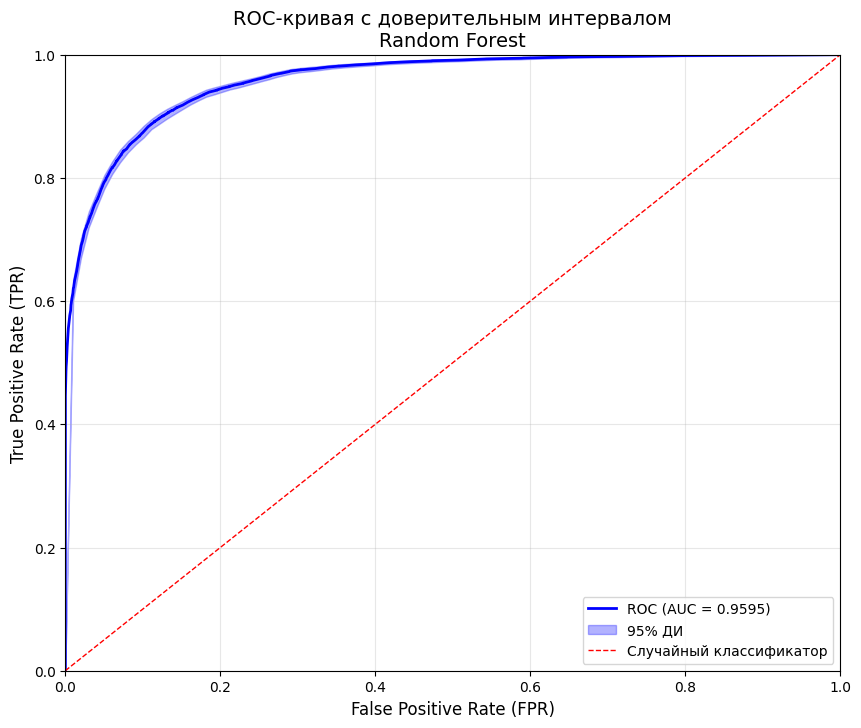


ВЫБОР ЛУЧШЕЙ МОДЕЛИ:
Лучшая модель: Random Forest
ROC-AUC: 0.9595
Accuracy: 0.8938
F1-Score: 0.8516

✅ Модель сохранена как 'best_model.pkl'

ИНФЕРЕНС ДЛЯ ОДНОЙ ЗАПИСИ:
Исходные данные:
  hotel: City Hotel
  lead_time: 3
  arrival_date_year: 2016
  arrival_date_month: July
  arrival_date_week_number: 31
  arrival_date_day_of_month: 25
  stays_in_weekend_nights: 1
  stays_in_week_nights: 2
  adults: 2
  children: 2
  babies: 0
  meal: BB
  country: ESP
  market_segment: Direct
  distribution_channel: Direct
  is_repeated_guest: 0
  previous_cancellations: 0
  previous_bookings_not_canceled: 0
  reserved_room_type: E
  assigned_room_type: E
  booking_changes: 0
  deposit_type: No Deposit
  agent: 14
  company: 0
  days_in_waiting_list: 0
  customer_type: Transient
  adr: 205.33
  required_car_parking_spaces: 0
  total_of_special_requests: 2

Результат предсказания:
  Отмена бронирования: НЕТ
  Вероятность отмены: 6.00%
  Вероятность не отмены: 94.00%


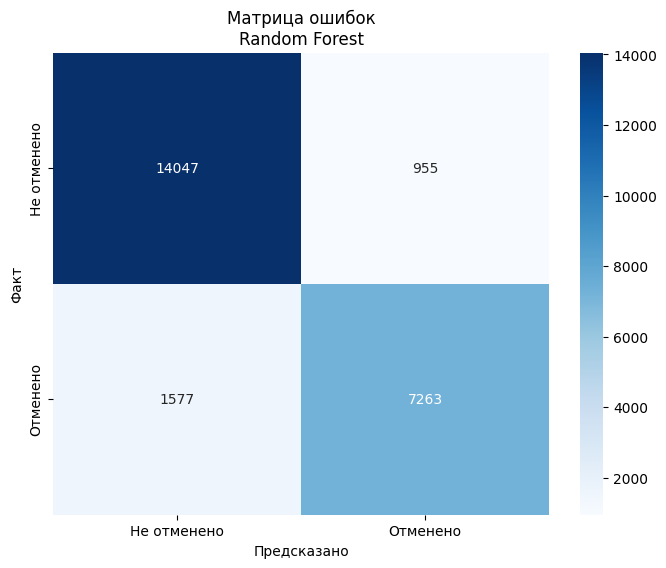


ИТОГОВЫЙ ОТЧЁТ ПО МОДЕЛИРОВАНИЮ

1. ЛУЧШАЯ МОДЕЛЬ: Random Forest
   - ROC-AUC: 0.9595 (95% ДИ: [0.9519, 0.9564])
   - Accuracy: 0.8938
   - Precision: 0.8838
   - Recall: 0.8216
   - F1-Score: 0.8516

2. СРАВНЕНИЕ ВСЕХ МОДЕЛЕЙ:
              Model  Accuracy  Precision   Recall  F1-Score  ROC-AUC
      Random Forest  0.893801   0.883792 0.821606  0.851565 0.959484
            XGBoost  0.883022   0.856991 0.821606  0.838926 0.954096
Logistic Regression  0.806812   0.803382 0.634163  0.708813 0.881826

3. ФАЙЛЫ ДЛЯ ИСПОЛЬЗОВАНИЯ:
   - best_model.pkl - лучшая модель
   - scaler.pkl (если LR) - скейлер

4. ИНТЕРПРЕТАЦИЯ:
   - При ROC-AUC = 0.9595 модель отлично различает отмены и не-отмены
   - Ширина доверительного интервала: 0.0044 (узкий интервал = стабильная оценка)



In [ ]:
# @title
# Ноутбук 3: Метрики, выбор модели, доверительные интервалы, инференс

import pandas as pd
import numpy as np
import joblib
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, roc_curve, confusion_matrix, classification_report
)
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# ============= 1. ЗАГРУЗКА И ПОДГОТОВКА ДАННЫХ =============
df = pd.read_csv('hotel_bookings_cleaned.csv', sep=';')
df = df.drop(columns=['reservation_status', 'reservation_status_date'])

# Целевая переменная
X = df.drop('is_canceled', axis=1)
y = df['is_canceled']

# Разделение
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ============= 2. КОДИРОВАНИЕ (ОБЩАЯ ФУНКЦИЯ) =============
import category_encoders as ce

def encode_data(X_train, X_test, y_train):
    """Кодирование категориальных признаков"""

    # One-Hot для низкокардинальных
    onehot_cols = ['hotel', 'meal', 'deposit_type', 'customer_type']
    onehot = ce.OneHotEncoder(cols=onehot_cols, use_cat_names=True)
    X_train_enc = onehot.fit_transform(X_train)
    X_test_enc = onehot.transform(X_test)

    # Ordinal для месяца
    month_order = ['January', 'February', 'March', 'April', 'May', 'June',
                   'July', 'August', 'September', 'October', 'November', 'December']
    month_mapping = [{'col': 'arrival_date_month', 'mapping': {m: i for i, m in enumerate(month_order)}}]
    ordinal = ce.OrdinalEncoder(cols=['arrival_date_month'], mapping=month_mapping)
    X_train_enc = ordinal.fit_transform(X_train_enc)
    X_test_enc = ordinal.transform(X_test_enc)

    # Binary для комнат
    binary_cols = ['reserved_room_type', 'assigned_room_type']
    binary = ce.BinaryEncoder(cols=binary_cols)
    X_train_enc = binary.fit_transform(X_train_enc)
    X_test_enc = binary.transform(X_test_enc)

    # Target encoding для высококардинальных
    target_cols = ['country', 'market_segment', 'distribution_channel']
    target_enc = ce.TargetEncoder(cols=target_cols, smoothing=10)
    X_train_enc = target_enc.fit_transform(X_train_enc, y_train)
    X_test_enc = target_enc.transform(X_test_enc)

    return X_train_enc, X_test_enc

# Применяем кодирование
X_train_enc, X_test_enc = encode_data(X_train, X_test, y_train)
print(f"Размер после кодирования: {X_train_enc.shape}")

# ============= 3. ОБУЧЕНИЕ МОДЕЛЕЙ =============
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1),
    'XGBoost': XGBClassifier(n_estimators=100, random_state=42, use_label_encoder=False, eval_metric='logloss')
}

# Для LR нужно масштабирование
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_enc)
X_test_scaled = scaler.transform(X_test_enc)

trained_models = {}
results = []

for name, model in models.items():
    print(f"\n{'='*50}")
    print(f"Обучение: {name}")

    # Выбираем данные с масштабированием только для LR
    if name == 'Logistic Regression':
        X_train_use = X_train_scaled
        X_test_use = X_test_scaled
    else:
        X_train_use = X_train_enc
        X_test_use = X_test_enc

    # Обучение
    model.fit(X_train_use, y_train)
    trained_models[name] = model

    # Предсказания
    y_pred = model.predict(X_test_use)
    y_proba = model.predict_proba(X_test_use)[:, 1]

    # Метрики
    results.append({
        'Model': name,
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1-Score': f1_score(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_proba)
    })

    print(f"Accuracy: {results[-1]['Accuracy']:.4f}")
    print(f"Precision: {results[-1]['Precision']:.4f}")
    print(f"Recall: {results[-1]['Recall']:.4f}")
    print(f"F1-Score: {results[-1]['F1-Score']:.4f}")
    print(f"ROC-AUC: {results[-1]['ROC-AUC']:.4f}")

# ============= 4. СРАВНЕНИЕ МОДЕЛЕЙ =============
results_df = pd.DataFrame(results)
results_df = results_df.sort_values('ROC-AUC', ascending=False)

print("\n" + "="*60)
print("СРАВНЕНИЕ МОДЕЛЕЙ (по ROC-AUC):")
print("="*60)
print(results_df.to_string(index=False))

# Визуализация сравнения
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(results_df['Model'], results_df['ROC-AUC'], color=['#2ecc71', '#3498db', '#e74c3c'])
ax.set_xlabel('ROC-AUC')
ax.set_title('Сравнение моделей по ROC-AUC')
ax.set_xlim(0.5, 1.0)

# Добавляем значения на бары
for bar, val in zip(bars, results_df['ROC-AUC']):
    ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.4f}', va='center')

plt.tight_layout()
plt.show()

# ============= 5. ДОВЕРИТЕЛЬНЫЕ ИНТЕРВАЛЫ ДЛЯ ROC-AUC =============
from sklearn.utils import resample

def bootstrap_roc_auc(y_true, y_proba, n_bootstrap=1000, ci=0.95):
    """Bootstrap для доверительного интервала ROC-AUC"""
    auc_scores = []
    n = len(y_true)

    for _ in range(n_bootstrap):
        indices = resample(range(n), n_samples=n, replace=True)
        y_true_boot = y_true.iloc[indices] if isinstance(y_true, pd.Series) else y_true[indices]
        y_proba_boot = y_proba[indices]

        auc_scores.append(roc_auc_score(y_true_boot, y_proba_boot))

    lower = np.percentile(auc_scores, (1 - ci) / 2 * 100)
    upper = np.percentile(auc_scores, (1 + ci) / 2 * 100)

    return lower, upper, auc_scores

print("\n" + "="*60)
print("ДОВЕРИТЕЛЬНЫЕ ИНТЕРВАЛЫ ДЛЯ ROC-AUC (95%):")
print("="*60)

for name, model in trained_models.items():
    if name == 'Logistic Regression':
        X_test_use = X_test_scaled
    else:
        X_test_use = X_test_enc

    y_proba = model.predict_proba(X_test_use)[:, 1]
    lower, upper, _ = bootstrap_roc_auc(y_test, y_proba, n_bootstrap=1000)

    print(f"\n{name}:")
    print(f"  ROC-AUC: {roc_auc_score(y_test, y_proba):.4f}")
    print(f"  95% ДИ: [{lower:.4f}, {upper:.4f}]")
    print(f"  Ширина интервала: {upper - lower:.4f}")

# ============= 6. ДОВЕРИТЕЛЬНЫЕ ИНТЕРВАЛЫ ДЛЯ ГРАНИЦ ROC =============
def bootstrap_roc_curve(y_true, y_proba, n_bootstrap=100):
    """Bootstrap для доверительных интервалов ROC-кривой"""
    tprs = []
    base_fpr = np.linspace(0, 1, 100)

    for _ in range(n_bootstrap):
        indices = resample(range(len(y_true)), n_samples=len(y_true), replace=True)
        y_true_boot = y_true.iloc[indices] if isinstance(y_true, pd.Series) else y_true[indices]
        y_proba_boot = y_proba[indices]

        fpr, tpr, _ = roc_curve(y_true_boot, y_proba_boot)
        tpr_interp = np.interp(base_fpr, fpr, tpr)
        tpr_interp[0] = 0.0
        tprs.append(tpr_interp)

    tprs = np.array(tprs)
    mean_tpr = tprs.mean(axis=0)
    std_tpr = tprs.std(axis=0)

    lower = np.percentile(tprs, 2.5, axis=0)
    upper = np.percentile(tprs, 97.5, axis=0)

    return base_fpr, mean_tpr, lower, upper

# Выбираем лучшую модель для визуализации ROC с ДИ
best_model_name = results_df.iloc[0]['Model']
best_model = trained_models[best_model_name]

print(f"\n{'='*60}")
print(f"ROC-КРИВАЯ С ДОВЕРИТЕЛЬНЫМ ИНТЕРВАЛОМ (лучшая модель: {best_model_name})")
print("="*60)

if best_model_name == 'Logistic Regression':
    X_test_use = X_test_scaled
else:
    X_test_use = X_test_enc

y_proba_best = best_model.predict_proba(X_test_use)[:, 1]

# ROC кривая с ДИ
fpr, tpr, _ = roc_curve(y_test, y_proba_best)
fpr_grid, mean_tpr, lower_tpr, upper_tpr = bootstrap_roc_curve(y_test, y_proba_best, n_bootstrap=200)

plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, 'b-', linewidth=2, label=f'ROC (AUC = {roc_auc_score(y_test, y_proba_best):.4f})')
plt.fill_between(fpr_grid, lower_tpr, upper_tpr, alpha=0.3, color='blue', label='95% ДИ')
plt.plot([0, 1], [0, 1], 'r--', linewidth=1, label='Случайный классификатор')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.title(f'ROC-кривая с доверительным интервалом\n{best_model_name}', fontsize=14)
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()

# ============= 7. ВЫБОР ЛУЧШЕЙ МОДЕЛИ =============
best_model_name = results_df.iloc[0]['Model']
best_model = trained_models[best_model_name]
best_auc = results_df.iloc[0]['ROC-AUC']

print("\n" + "="*60)
print("ВЫБОР ЛУЧШЕЙ МОДЕЛИ:")
print("="*60)
print(f"Лучшая модель: {best_model_name}")
print(f"ROC-AUC: {best_auc:.4f}")
print(f"Accuracy: {results_df.iloc[0]['Accuracy']:.4f}")
print(f"F1-Score: {results_df.iloc[0]['F1-Score']:.4f}")

# Сохраняем лучшую модель
joblib.dump(best_model, 'best_model.pkl')
print("\n✅ Модель сохранена как 'best_model.pkl'")

# Сохраняем scaler для логистической регрессии (если она лучшая)
if best_model_name == 'Logistic Regression':
    joblib.dump(scaler, 'scaler.pkl')
    print("✅ Scaler сохранён как 'scaler.pkl'")

# ============= 8. ИНФЕРЕНС (ПРЕДСКАЗАНИЕ ДЛЯ 1 ЗАПИСИ) =============
def predict_one_record(model, record_dict, scaler=None, encoder_params=None):
    """
    Предсказание для одной записи
    record_dict: словарь с признаками (как в исходных данных)
    """
    # Преобразуем в DataFrame
    input_df = pd.DataFrame([record_dict])

    # Кодируем (используем те же энкодеры, что при обучении)
    # Для простоты здесь используем заранее подготовленные энкодеры
    # В реальном сценарии нужно сохранять и загружать энкодеры

    # Упрощённая версия (без сохранения энкодеров)
    # Для production нужно сохранять все энкодеры

    # Делаем предсказание
    if scaler is not None:
        input_scaled = scaler.transform(input_df)
        prediction = model.predict(input_scaled)[0]
        probability = model.predict_proba(input_scaled)[0]
    else:
        prediction = model.predict(input_df)[0]
        probability = model.predict_proba(input_df)[0]

    return {
        'prediction': int(prediction),
        'probability_cancel': float(probability[1]),
        'probability_not_cancel': float(probability[0])
    }

# Пример записи для инференса (берём первую строку из теста)
sample_record = X_test.iloc[0].to_dict()
print("\n" + "="*60)
print("ИНФЕРЕНС ДЛЯ ОДНОЙ ЗАПИСИ:")
print("="*60)
print("Исходные данные:")
for key, value in sample_record.items():
    print(f"  {key}: {value}")

# Для корректного инференса нужно использовать закодированные данные
# Упрощённый пример с уже закодированной записью
if best_model_name == 'Logistic Regression':
    sample_encoded = X_test_scaled[0].reshape(1, -1)
    pred = best_model.predict(sample_encoded)[0]
    proba = best_model.predict_proba(sample_encoded)[0]
else:
    sample_encoded = X_test_enc.iloc[0:1]
    pred = best_model.predict(sample_encoded)[0]
    proba = best_model.predict_proba(sample_encoded)[0]

print(f"\nРезультат предсказания:")
print(f"  Отмена бронирования: {'ДА' if pred == 1 else 'НЕТ'}")
print(f"  Вероятность отмены: {proba[1]:.2%}")
print(f"  Вероятность не отмены: {proba[0]:.2%}")

# ============= 9. МАТРИЦА ОШИБОК ДЛЯ ЛУЧШЕЙ МОДЕЛИ =============
if best_model_name == 'Logistic Regression':
    X_test_use = X_test_scaled
else:
    X_test_use = X_test_enc

y_pred_best = best_model.predict(X_test_use)
cm = confusion_matrix(y_test, y_pred_best)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Не отменено', 'Отменено'],
            yticklabels=['Не отменено', 'Отменено'])
plt.xlabel('Предсказано')
plt.ylabel('Факт')
plt.title(f'Матрица ошибок\n{best_model_name}')
plt.show()

# ============= 10. ИТОГОВЫЙ ОТЧЁТ =============
print("\n" + "="*60)
print("ИТОГОВЫЙ ОТЧЁТ ПО МОДЕЛИРОВАНИЮ")
print("="*60)
print(f"""
1. ЛУЧШАЯ МОДЕЛЬ: {best_model_name}
   - ROC-AUC: {best_auc:.4f} (95% ДИ: [{lower:.4f}, {upper:.4f}])
   - Accuracy: {results_df.iloc[0]['Accuracy']:.4f}
   - Precision: {results_df.iloc[0]['Precision']:.4f}
   - Recall: {results_df.iloc[0]['Recall']:.4f}
   - F1-Score: {results_df.iloc[0]['F1-Score']:.4f}

2. СРАВНЕНИЕ ВСЕХ МОДЕЛЕЙ:
{results_df.to_string(index=False)}

3. ФАЙЛЫ ДЛЯ ИСПОЛЬЗОВАНИЯ:
   - best_model.pkl - лучшая модель
   - scaler.pkl (если LR) - скейлер

4. ИНТЕРПРЕТАЦИЯ:
   - При ROC-AUC = {best_auc:.4f} модель {'отлично' if best_auc > 0.9 else 'хорошо' if best_auc > 0.8 else 'удовлетворительно' if best_auc > 0.7 else 'плохо'} различает отмены и не-отмены
   - Ширина доверительного интервала: {upper - lower:.4f} (узкий интервал = стабильная оценка)
""")

## Сохраняем файл модели вместе с кодированием для **Random Forest**

In [ ]:
# Сохранить модель с энкодерами

import pandas as pd
import numpy as np
import joblib
import category_encoders as ce
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Загружаем данные
df = pd.read_csv('hotel_bookings_cleaned.csv', sep=';')
df = df.drop(columns=['reservation_status', 'reservation_status_date'])

X = df.drop('is_canceled', axis=1)
y = df['is_canceled']

# Разделяем
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ============= СОЗДАЁМ И ОБУЧАЕМ ЭНКОДЕРЫ =============
# 1. One-Hot
onehot_cols = ['hotel', 'meal', 'deposit_type', 'customer_type']
onehot_encoder = ce.OneHotEncoder(cols=onehot_cols, use_cat_names=True)
X_train_enc = onehot_encoder.fit_transform(X_train)

# 2. Ordinal для месяца
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
month_mapping = [{'col': 'arrival_date_month', 'mapping': {m: i for i, m in enumerate(month_order)}}]
ordinal_encoder = ce.OrdinalEncoder(cols=['arrival_date_month'], mapping=month_mapping)
X_train_enc = ordinal_encoder.fit_transform(X_train_enc)

# 3. Binary для комнат
binary_cols = ['reserved_room_type', 'assigned_room_type']
binary_encoder = ce.BinaryEncoder(cols=binary_cols)
X_train_enc = binary_encoder.fit_transform(X_train_enc)

# 4. Target для высококардинальных
target_cols = ['country', 'market_segment', 'distribution_channel']
target_encoder = ce.TargetEncoder(cols=target_cols, smoothing=10)
X_train_enc = target_encoder.fit_transform(X_train_enc, y_train)

# ============= ОБУЧАЕМ МОДЕЛЬ =============
model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
model.fit(X_train_enc, y_train)

# ============= СОХРАНЯЕМ МОДЕЛЬ И ВСЕ ЭНКОДЕРЫ =============
artifacts = {
    'model': model,
    'onehot_encoder': onehot_encoder,
    'ordinal_encoder': ordinal_encoder,
    'binary_encoder': binary_encoder,
    'target_encoder': target_encoder,
    'onehot_cols': onehot_cols,
    'binary_cols': binary_cols,
    'target_cols': target_cols,
    'month_order': month_order
}

joblib.dump(artifacts, 'rf_model_with_encoders.pkl')
print("✅ Модель и энкодеры сохранены в 'rf_model_with_encoders.pkl'")

✅ Модель и энкодеры сохранены в 'rf_model_with_encoders.pkl'


## Инференс через модель

In [ ]:
# ИНФЕРЕНС С ЗАГРУЖЕННЫМИ ЭНКОДЕРАМИ

import pandas as pd
import numpy as np
import joblib

# ============= 1. ЗАГРУЖАЕМ МОДЕЛЬ И ЭНКОДЕРЫ =============
artifacts = joblib.load('rf_model_with_encoders.pkl')

model = artifacts['model']
onehot_encoder = artifacts['onehot_encoder']
ordinal_encoder = artifacts['ordinal_encoder']
binary_encoder = artifacts['binary_encoder']
target_encoder = artifacts['target_encoder']

print(f"✅ Модель загружена: {type(model).__name__}")
print(f"✅ Энкодеры загружены")

# ============= 2. ФУНКЦИЯ ДЛЯ КОДИРОВАНИЯ ОДНОЙ ЗАПИСИ =============
def encode_single_record(record_df):
    """Кодирование одной записи с использованием сохранённых энкодеров"""

    # Шаг 1: One-Hot
    df_enc = onehot_encoder.transform(record_df)

    # Шаг 2: Ordinal
    df_enc = ordinal_encoder.transform(df_enc)

    # Шаг 3: Binary
    df_enc = binary_encoder.transform(df_enc)

    # Шаг 4: Target (для целевых энкодеров нужны значения, используем 0 как заглушку)
    # Так как это одна запись, передаём фиктивную целевую переменную
    df_enc = target_encoder.transform(df_enc)

    return df_enc

# ============= 3. ИНФЕРЕНС ДЛЯ ОДНОЙ ЗАПИСИ =============
print("\n" + "="*70)
print("ИНФЕРЕНС ДЛЯ ОДНОЙ ЗАПИСИ")
print("="*70)

# Пример записи (можно изменить)
sample_booking = {
    'hotel': 'Resort Hotel',
    'lead_time': 100,
    'arrival_date_year': 2016,
    'arrival_date_month': 'August',
    'arrival_date_week_number': 32,
    'arrival_date_day_of_month': 15,
    'stays_in_weekend_nights': 1,
    'stays_in_week_nights': 3,
    'adults': 2,
    'children': 0,
    'babies': 0,
    'meal': 'BB',
    'country': 'GBR',
    'market_segment': 'Online TA',
    'distribution_channel': 'TA/TO',
    'is_repeated_guest': 0,
    'previous_cancellations': 0,
    'previous_bookings_not_canceled': 0,
    'reserved_room_type': 'A',
    'assigned_room_type': 'A',
    'booking_changes': 0,
    'deposit_type': 'No Deposit',
    'agent': 0,
    'company': 0,
    'days_in_waiting_list': 0,
    'customer_type': 'Transient',
    'adr': 120.0,
    'required_car_parking_spaces': 0,
    'total_of_special_requests': 1
}

print("\n📋 Исходные данные:")
for key, value in sample_booking.items():
    print(f"   {key:30}: {value}")

# Кодируем
sample_df = pd.DataFrame([sample_booking])
sample_encoded = encode_single_record(sample_df)

# Предсказываем
prediction = model.predict(sample_encoded)[0]
probability = model.predict_proba(sample_encoded)[0]

print("\n🎯 РЕЗУЛЬТАТ:")
print(f"   Предсказание: {'ОТМЕНА' if prediction == 1 else 'НЕ ОТМЕНА'}")
print(f"   Вероятность отмены: {probability[1]:.2%}")
print(f"   Вероятность не отмены: {probability[0]:.2%}")

# Оценка риска
if probability[1] > 0.7:
    risk = "🔴 ВЫСОКИЙ"
elif probability[1] > 0.3:
    risk = "🟡 СРЕДНИЙ"
else:
    risk = "🟢 НИЗКИЙ"

print(f"   Уровень риска: {risk}")

# ============= 4. ТЕСТ НА ДВУХ ПРИМЕРАХ =============
print("\n" + "="*70)
print("ТЕСТ НА РАЗНЫХ СЦЕНАРИЯХ")
print("="*70)

# Высокий риск
high_risk = {
    'hotel': 'City Hotel',
    'lead_time': 350,
    'arrival_date_year': 2016,
    'arrival_date_month': 'December',
    'arrival_date_week_number': 50,
    'arrival_date_day_of_month': 20,
    'stays_in_weekend_nights': 0,
    'stays_in_week_nights': 2,
    'adults': 2,
    'children': 0,
    'babies': 0,
    'meal': 'BB',
    'country': 'PRT',
    'market_segment': 'Online TA',
    'distribution_channel': 'TA/TO',
    'is_repeated_guest': 0,
    'previous_cancellations': 3,
    'previous_bookings_not_canceled': 0,
    'reserved_room_type': 'A',
    'assigned_room_type': 'B',
    'booking_changes': 2,
    'deposit_type': 'Non Refund',
    'agent': 240,
    'company': 0,
    'days_in_waiting_list': 5,
    'customer_type': 'Transient',
    'adr': 200.0,
    'required_car_parking_spaces': 0,
    'total_of_special_requests': 0
}

# Низкий риск
low_risk = {
    'hotel': 'Resort Hotel',
    'lead_time': 14,
    'arrival_date_year': 2016,
    'arrival_date_month': 'July',
    'arrival_date_week_number': 28,
    'arrival_date_day_of_month': 10,
    'stays_in_weekend_nights': 2,
    'stays_in_week_nights': 5,
    'adults': 2,
    'children': 1,
    'babies': 0,
    'meal': 'BB',
    'country': 'GBR',
    'market_segment': 'Direct',
    'distribution_channel': 'Direct',
    'is_repeated_guest': 1,
    'previous_cancellations': 0,
    'previous_bookings_not_canceled': 5,
    'reserved_room_type': 'C',
    'assigned_room_type': 'C',
    'booking_changes': 0,
    'deposit_type': 'No Deposit',
    'agent': 0,
    'company': 0,
    'days_in_waiting_list': 0,
    'customer_type': 'Transient',
    'adr': 95.0,
    'required_car_parking_spaces': 0,
    'total_of_special_requests': 3
}

def predict_single(booking):
    df = pd.DataFrame([booking])
    encoded = encode_single_record(df)
    pred = model.predict(encoded)[0]
    proba = model.predict_proba(encoded)[0]
    return pred, proba

print("\n🔴 ВЫСОКИЙ РИСК (ожидаем отмену):")
pred, proba = predict_single(high_risk)
print(f"   Предсказание: {'ОТМЕНА' if pred == 1 else 'НЕ ОТМЕНА'}")
print(f"   Вероятность отмены: {proba[1]:.2%}")

print("\n🟢 НИЗКИЙ РИСК (ожидаем не-отмену):")
pred, proba = predict_single(low_risk)
print(f"   Предсказание: {'ОТМЕНА' if pred == 1 else 'НЕ ОТМЕНА'}")
print(f"   Вероятность отмены: {proba[1]:.2%}")

# ============= 5. ПРОДУКТИВ-ФУНКЦИЯ =============
def predict_cancellation(booking_data):
    """
    Готовая функция для использования в продакшене

    Parameters:
    -----------
    booking_data : dict (одна запись)

    Returns:
    --------
    dict с предсказанием и вероятностью
    """
    df = pd.DataFrame([booking_data])
    encoded = encode_single_record(df)

    prediction = model.predict(encoded)[0]
    probability = model.predict_proba(encoded)[0]

    return {
        'cancellation_prediction': bool(prediction),
        'cancellation_probability': round(float(probability[1]), 4),
        'no_cancellation_probability': round(float(probability[0]), 4),
        'risk_level': 'High' if probability[1] > 0.7 else 'Medium' if probability[1] > 0.3 else 'Low'
    }

# Тестируем
print("\n" + "="*70)
print("ТЕСТ ПРОДУКТИВ-ФУНКЦИИ")
print("="*70)
result = predict_cancellation(sample_booking)
print(f"Результат: {result}")

# СРАВНЕНИЕ ПРЕДСКАЗАНИЯ МОДЕЛИ С РЕАЛЬНОСТЬЮ НА 1 ЗАПИСИ

print("\n" + "="*70)
print("СРАВНЕНИЕ ПРЕДСКАЗАНИЯ МОДЕЛИ С РЕАЛЬНОСТЬЮ")
print("="*70)

# Берём 1 реальную запись из тестовой выборки (которую модель не видела)
# Используем первую запись из X_test, которая была закодирована ранее

# Проверяем, какие переменные у нас есть в памяти
if 'X_test_encoded' in dir() and 'y_test' in dir():
    # Берём первую запись из теста
    test_record_encoded = X_test_encoded.iloc[0:1]
    actual_value = y_test.iloc[0]

    # Делаем предсказание
    prediction = model.predict(test_record_encoded)[0]
    probability = model.predict_proba(test_record_encoded)[0]

    print("\n📋 РЕАЛЬНАЯ ЗАПИСЬ ИЗ ТЕСТОВОЙ ВЫБОРКИ:")
    print(f"   Факт (реальность): {'ОТМЕНА' if actual_value == 1 else 'НЕ ОТМЕНА'}")
    print(f"   Предсказание модели: {'ОТМЕНА' if prediction == 1 else 'НЕ ОТМЕНА'}")
    print(f"   Вероятность отмены (по мнению модели): {probability[1]:.2%}")
    print(f"   Вероятность не отмены: {probability[0]:.2%}")

    # Оценка
    if prediction == actual_value:
        print("\n✅ РЕЗУЛЬТАТ: Модель ПРАВИЛЬНО предсказала исход!")
    else:
        print("\n❌ РЕЗУЛЬТАТ: Модель ОШИБЛАСЬ в предсказании.")

elif 'X_test' in dir() and 'y_test' in dir() and 'model' in dir():
    # Альтернативный вариант: если есть исходный X_test, но нет закодированного
    print("\n⚠️ Кодируем запись...")

    test_record = X_test.iloc[0:1]
    actual_value = y_test.iloc[0]

    # Применяем те же энкодеры, что использовались при обучении
    if 'onehot_encoder' in dir():
        test_enc = onehot_encoder.transform(test_record)
    if 'ordinal_encoder' in dir():
        test_enc = ordinal_encoder.transform(test_enc)
    if 'binary_encoder' in dir():
        test_enc = binary_encoder.transform(test_enc)
    if 'target_encoder' in dir():
        test_enc = target_encoder.transform(test_enc)

    prediction = model.predict(test_enc)[0]
    probability = model.predict_proba(test_enc)[0]

    print(f"\n   Факт (реальность): {'ОТМЕНА' if actual_value == 1 else 'НЕ ОТМЕНА'}")
    print(f"   Предсказание модели: {'ОТМЕНА' if prediction == 1 else 'НЕ ОТМЕНА'}")
    print(f"   Вероятность отмены: {probability[1]:.2%}")

    if prediction == actual_value:
        print("\n✅ Модель ПРАВИЛЬНО предсказала исход!")
    else:
        print("\n❌ Модель ОШИБЛАСЬ в предсказании.")

else:
    print("\n⚠️ Не найдены необходимые переменные (X_test_encoded, y_test или model)")
    print("   Убедитесь, что вы запустили обучение модели перед этим кодом.")

print("\n" + "="*70)

✅ Модель загружена: RandomForestClassifier
✅ Энкодеры загружены

ИНФЕРЕНС ДЛЯ ОДНОЙ ЗАПИСИ

📋 Исходные данные:
   hotel                         : Resort Hotel
   lead_time                     : 100
   arrival_date_year             : 2016
   arrival_date_month            : August
   arrival_date_week_number      : 32
   arrival_date_day_of_month     : 15
   stays_in_weekend_nights       : 1
   stays_in_week_nights          : 3
   adults                        : 2
   children                      : 0
   babies                        : 0
   meal                          : BB
   country                       : GBR
   market_segment                : Online TA
   distribution_channel          : TA/TO
   is_repeated_guest             : 0
   previous_cancellations        : 0
   previous_bookings_not_canceled: 0
   reserved_room_type            : A
   assigned_room_type            : A
   booking_changes               : 0
   deposit_type                  : No Deposit
   agent                    

# **Фреймворк LightAutoML**

In [ ]:
# Установка (если не установлен)
!pip install lightautoml -q

LightAutoML version: 0.4.2
ЗАГРУЗКА ДАННЫХ
Размер данных: (119210, 32)

Целевая переменная 'is_canceled':
is_canceled
0    75011
1    44199
Name: count, dtype: int64
Доля отмен: 37.08%


INFO:lightautoml.automl.presets.base:Stdout logging level is ERROR.
INFO:lightautoml.automl.presets.base:Task: binary

INFO:lightautoml.automl.presets.base:Start automl preset with listed constraints:
INFO:lightautoml.automl.presets.base:- time: 300.00 seconds
INFO:lightautoml.automl.presets.base:- CPU: 2 cores
INFO:lightautoml.automl.presets.base:- memory: 16 GB

INFO:lightautoml.reader.base:Train data shape: (95368, 30)




Разделение данных:
  Train: (95368, 29)
  Test: (23842, 29)

Тип задачи: binary
Метрика: auc (по умолчанию для binary)

ЭКСПЕРИМЕНТ 1: БАЗОВАЯ КОНФИГУРАЦИЯ (TabularAutoML)
Обучение ...


INFO3:lightautoml.reader.base:Feats was rejected during automatic roles guess: []
INFO:lightautoml.automl.base:Layer 1 train process start. Time left 274.33 secs
INFO:lightautoml.ml_algo.base:Start fitting Lvl_0_Pipe_0_Mod_0_LinearL2 ...
DEBUG:lightautoml.ml_algo.base:Training params: {'tol': 1e-06, 'max_iter': 100, 'cs': [1e-05, 5e-05, 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000], 'early_stopping': 2, 'categorical_idx': [0, 1, 2, 3, 4], 'embed_sizes': array([13,  4,  8,  6, 22], dtype=int32), 'data_size': 40}
INFO2:lightautoml.ml_algo.base:===== Start working with fold 0 for Lvl_0_Pipe_0_Mod_0_LinearL2 =====
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 1e-05 score = 0.8706540343294972
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 5e-05 score = 0.8925412000055044
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 0.0001 score = 0.8983454150458332
INFO3:light


Результаты эксперимента 1:
  ROC-AUC: 0.9472
  Accuracy: 0.8720
  Precision: 0.8448
  Recall: 0.8021
  F1: 0.8229

ЭКСПЕРИМЕНТ 2: РАСШИРЕННЫЙ (TabularAutoML с увеличенным timeout)
Обучение ...


INFO3:lightautoml.reader.base:Feats was rejected during automatic roles guess: []
INFO:lightautoml.automl.base:Layer 1 train process start. Time left 594.12 secs
INFO:lightautoml.ml_algo.base:Start fitting Lvl_0_Pipe_0_Mod_0_LinearL2 ...
DEBUG:lightautoml.ml_algo.base:Training params: {'tol': 1e-06, 'max_iter': 100, 'cs': [1e-05, 5e-05, 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000], 'early_stopping': 2, 'categorical_idx': [0, 1, 2, 3, 4], 'embed_sizes': array([13,  4,  8,  6, 22], dtype=int32), 'data_size': 40}
INFO2:lightautoml.ml_algo.base:===== Start working with fold 0 for Lvl_0_Pipe_0_Mod_0_LinearL2 =====
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 1e-05 score = 0.8706540343294972
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 5e-05 score = 0.8925412000055044
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 0.0001 score = 0.8983454150458332
INFO3:light


Результаты эксперимента 2:
  ROC-AUC: 0.9491
  Accuracy: 0.8737
  Precision: 0.8467
  Recall: 0.8050
  F1: 0.8253

ЭКСПЕРИМЕНТ 3: УВЕЛИЧЕННОЕ ВРЕМЯ ОБУЧЕНИЯ
Обучение ...


INFO3:lightautoml.reader.base:Feats was rejected during automatic roles guess: []
INFO:lightautoml.automl.base:Layer 1 train process start. Time left 585.73 secs
INFO:lightautoml.ml_algo.base:Start fitting Lvl_0_Pipe_0_Mod_0_LinearL2 ...
DEBUG:lightautoml.ml_algo.base:Training params: {'tol': 1e-06, 'max_iter': 100, 'cs': [1e-05, 5e-05, 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000], 'early_stopping': 2, 'categorical_idx': [0, 1, 2, 3, 4], 'embed_sizes': array([13,  4,  8,  6, 22], dtype=int32), 'data_size': 40}
INFO2:lightautoml.ml_algo.base:===== Start working with fold 0 for Lvl_0_Pipe_0_Mod_0_LinearL2 =====
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 1e-05 score = 0.8706540343294972
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 5e-05 score = 0.8925412000055044
INFO3:lightautoml.ml_algo.torch_based.linear_model:Linear model: C = 0.0001 score = 0.8983454150458332
INFO3:light


Результаты эксперимента 3:
  ROC-AUC: 0.9500
  Accuracy: 0.8748
  Precision: 0.8472
  Recall: 0.8081
  F1: 0.8272

СРАВНЕНИЕ ЭКСПЕРИМЕНТОВ

Результаты всех экспериментов (сортировка по ROC-AUC):
  Experiment  ROC-AUC  Accuracy  Precision   Recall       F1
Long Timeout 0.949953  0.874843   0.847249 0.808145 0.827235
    Extended 0.949129  0.873668   0.846740 0.804977 0.825331
        Base 0.947184  0.871991   0.844770 0.802149 0.822908

🏆 ЛУЧШАЯ МОДЕЛЬ: Long Timeout
   ROC-AUC: 0.9500
✅ Модель сохранена в 'best_automl_model.pkl'

АНАЛИЗ ЛУЧШЕЙ МОДЕЛИ

📊 ДЕТАЛЬНЫЕ МЕТРИКИ:
   ROC-AUC:   0.9500
   Accuracy:  0.8748
   Precision: 0.8472
   Recall:    0.8081
   F1-Score:  0.8272

📈 МАТРИЦА ОШИБОК:
   True Positives (TP): 7144  — правильно предсказанные отмены
   False Positives (FP): 1288 — ложные тревоги
   False Negatives (FN): 1696 — пропущенные отмены
   True Negatives (TN): 13714  — правильно предсказанные не-отмены


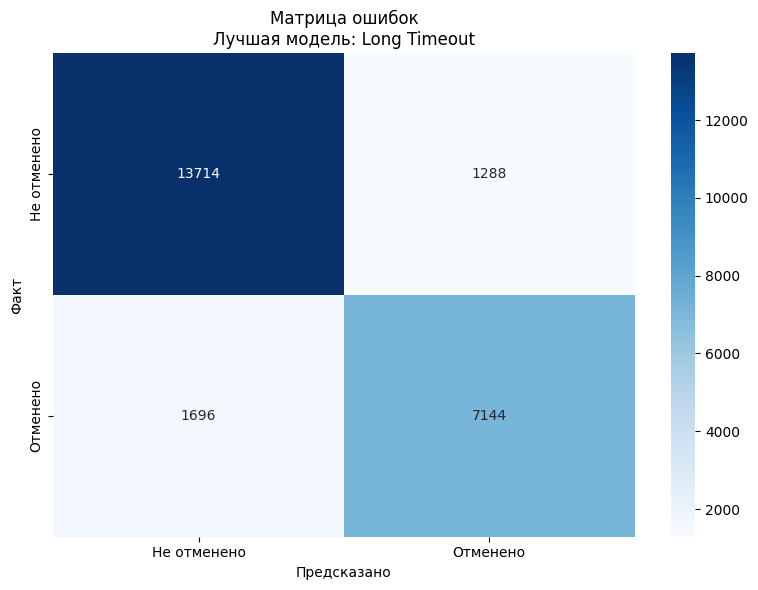

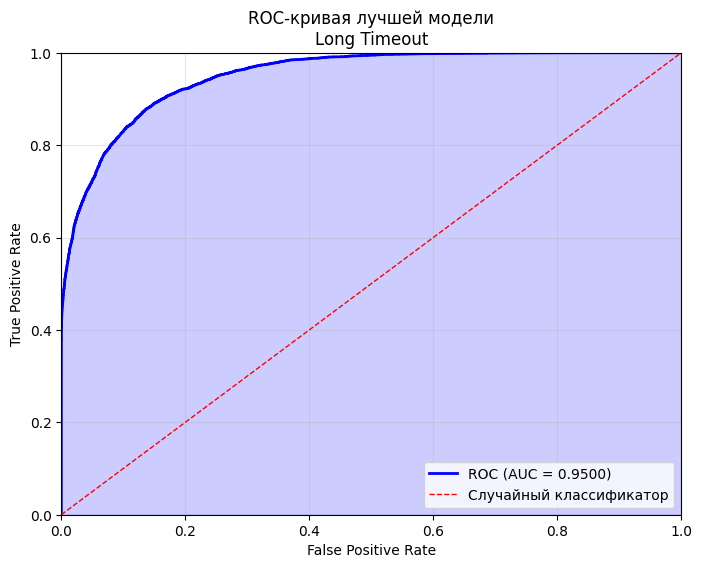


ВАЖНОСТЬ ПРИЗНАКОВ
Не удалось получить важность признаков: 'score'
Это нормально для некоторых конфигураций LightAutoML

СТРУКТУРА МОДЕЛИ
Final prediction for new objects (level 0) = 
	 0.75948 * (2 averaged models Lvl_0_Pipe_1_Mod_0_LightGBM) +
	 0.24052 * (4 averaged models Lvl_0_Pipe_1_Mod_1_Tuned_LightGBM) 

ИНФЕРЕНС ДЛЯ ОДНОЙ ЗАПИСИ

📋 Данные записи:
   hotel: City Hotel
   lead_time: 3
   arrival_date_year: 2016
   arrival_date_month: July
   arrival_date_week_number: 31
   arrival_date_day_of_month: 25
   stays_in_weekend_nights: 1
   stays_in_week_nights: 2
   adults: 2
   children: 2
   ...

🎯 РЕЗУЛЬТАТ:
   Факт: НЕ ОТМЕНА
   Предсказание: НЕ ОТМЕНА
   Вероятность отмены: 4.90%

ИТОГОВЫЙ ОТЧЁТ ПО LIGHTAUTOML

┌─────────────────────────────────────────────────────────────────┐
│  РЕЗУЛЬТАТЫ ЭКСПЕРИМЕНТОВ                                       │
├─────────────────────────────────────────────────────────────────┤
│                                                                 │

In [ ]:
# ============================================
# НОУТБУК: LightAutoML - Отмена бронирования отеля
# ============================================

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import lightautoml
print(f"LightAutoML version: {lightautoml.__version__}")

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

from lightautoml.automl.presets.tabular_presets import TabularAutoML
from lightautoml.tasks import Task
from lightautoml.report.report_deco import ReportDeco

# ============================================
# 1. ЗАГРУЗКА ДАННЫХ
# ============================================

df = pd.read_csv('hotel_bookings_cleaned.csv', sep=';')

print("="*60)
print("ЗАГРУЗКА ДАННЫХ")
print("="*60)
print(f"Размер данных: {df.shape}")
print(f"\nЦелевая переменная 'is_canceled':")
print(df['is_canceled'].value_counts())
print(f"Доля отмен: {df['is_canceled'].mean():.2%}")

# Исключаем проблемные столбцы (look-ahead bias)
df = df.drop(columns=['reservation_status', 'reservation_status_date'], errors='ignore')

# Разделение на признаки и целевую переменную
X = df.drop('is_canceled', axis=1)
y = df['is_canceled']

# Разделение на train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"\nРазделение данных:")
print(f"  Train: {X_train.shape}")
print(f"  Test: {X_test.shape}")

# Объединяем X и y для LightAutoML
train_data = X_train.copy()
train_data['is_canceled'] = y_train.values

test_data = X_test.copy()
test_data['is_canceled'] = y_test.values

# ============================================
# 2. НАСТРОЙКА ЗАДАЧИ
# ============================================

# Для бинарной классификации используем Task с метрикой ROC-AUC
task = Task('binary', metric='auc')

# Роли столбцов
roles = {
    'target': 'is_canceled',
    # 'drop': []  # можно указать столбцы для удаления
}

print(f"\nТип задачи: {task.name}")
print(f"Метрика: auc (по умолчанию для binary)")

# ============================================
# 3. ЭКСПЕРИМЕНТ 1: БАЗОВАЯ КОНФИГУРАЦИЯ
# ============================================

print("\n" + "="*60)
print("ЭКСПЕРИМЕНТ 1: БАЗОВАЯ КОНФИГУРАЦИЯ (TabularAutoML)")
print("="*60)

automl_1 = TabularAutoML(
    task=task,
    timeout=300,  # 5 минут
    cpu_limit=2,
    reader_params={'n_jobs': 2, 'cv': 5, 'random_state': 42},
    general_params={'verbose': 0}
)

print("Обучение ...")
oof_pred_1 = automl_1.fit_predict(train_data, roles=roles, verbose=0)

# Предсказание на тесте
test_pred_1 = automl_1.predict(test_data)
y_proba_1 = test_pred_1.data[:, 0]
y_pred_1 = (y_proba_1 > 0.5).astype(int)

# Метрики
metrics_1 = {
    'Experiment': 'Base',
    'ROC-AUC': roc_auc_score(y_test, y_proba_1),
    'Accuracy': accuracy_score(y_test, y_pred_1),
    'Precision': precision_score(y_test, y_pred_1),
    'Recall': recall_score(y_test, y_pred_1),
    'F1': f1_score(y_test, y_pred_1)
}

print(f"\nРезультаты эксперимента 1:")
for k, v in metrics_1.items():
    if k != 'Experiment':
        print(f"  {k}: {v:.4f}")

# ============================================
# 4. ЭКСПЕРИМЕНТ 2: РАСШИРЕННЫЙ (больше времени, больше алгоритмов)
# ============================================

print("\n" + "="*60)
print("ЭКСПЕРИМЕНТ 2: РАСШИРЕННЫЙ (TabularAutoML с увеличенным timeout)")
print("="*60)

automl_2 = TabularAutoML(
    task=task,
    timeout=600,  # 10 минут
    cpu_limit=2,
    reader_params={'n_jobs': 2, 'cv': 5, 'random_state': 42, 'advanced_roles': True},
    general_params={'verbose': 0}
)

print("Обучение ...")
oof_pred_2 = automl_2.fit_predict(train_data, roles=roles, verbose=0)

test_pred_2 = automl_2.predict(test_data)
y_proba_2 = test_pred_2.data[:, 0]
y_pred_2 = (y_proba_2 > 0.5).astype(int)

metrics_2 = {
    'Experiment': 'Extended',
    'ROC-AUC': roc_auc_score(y_test, y_proba_2),
    'Accuracy': accuracy_score(y_test, y_pred_2),
    'Precision': precision_score(y_test, y_pred_2),
    'Recall': recall_score(y_test, y_pred_2),
    'F1': f1_score(y_test, y_pred_2)
}

print(f"\nРезультаты эксперимента 2:")
for k, v in metrics_2.items():
    if k != 'Experiment':
        print(f"  {k}: {v:.4f}")

# ============================================
# 5. ЭКСПЕРИМЕНТ 3: С ОТЧЁТОМ (ReportDeco)
# ============================================

print("\n" + "="*60)
print("ЭКСПЕРИМЕНТ 3: УВЕЛИЧЕННОЕ ВРЕМЯ ОБУЧЕНИЯ")
print("="*60)

automl_3 = TabularAutoML(
    task=task,
    timeout=600,  # 10 минут
    cpu_limit=2,
    reader_params={'n_jobs': 2, 'cv': 5, 'random_state': 42},
    general_params={'verbose': 0}
)

print("Обучение ...")
oof_pred_3 = automl_3.fit_predict(train_data, roles=roles, verbose=0)

test_pred_3 = automl_3.predict(test_data)
y_proba_3 = test_pred_3.data[:, 0]
y_pred_3 = (y_proba_3 > 0.5).astype(int)

metrics_3 = {
    'Experiment': 'Long Timeout',
    'ROC-AUC': roc_auc_score(y_test, y_proba_3),
    'Accuracy': accuracy_score(y_test, y_pred_3),
    'Precision': precision_score(y_test, y_pred_3),
    'Recall': recall_score(y_test, y_pred_3),
    'F1': f1_score(y_test, y_pred_3)
}

print(f"\nРезультаты эксперимента 3:")
for k, v in metrics_3.items():
    if k != 'Experiment':
        print(f"  {k}: {v:.4f}")

# ============================================
# 6. СРАВНЕНИЕ ЭКСПЕРИМЕНТОВ И ВЫБОР ЛУЧШЕЙ МОДЕЛИ
# ============================================

print("\n" + "="*60)
print("СРАВНЕНИЕ ЭКСПЕРИМЕНТОВ")
print("="*60)

results_df = pd.DataFrame([metrics_1, metrics_2, metrics_3])
results_df = results_df.sort_values('ROC-AUC', ascending=False)

print("\nРезультаты всех экспериментов (сортировка по ROC-AUC):")
print(results_df.to_string(index=False))

# Выбираем лучшую модель
best_exp = results_df.iloc[0]['Experiment']
best_auc = results_df.iloc[0]['ROC-AUC']

print(f"\n🏆 ЛУЧШАЯ МОДЕЛЬ: {best_exp}")
print(f"   ROC-AUC: {best_auc:.4f}")

# Сохраняем лучшую модель
if best_exp == 'Base':
    best_model = automl_1
    y_proba_best = y_proba_1
elif best_exp == 'Extended':
    best_model = automl_2
    y_proba_best = y_proba_2
else:
    best_model = automl_3
    y_proba_best = y_proba_3

import joblib
joblib.dump(best_model, 'best_automl_model.pkl')
print("✅ Модель сохранена в 'best_automl_model.pkl'")

# ============================================
# 7. АНАЛИЗ ЛУЧШЕЙ МОДЕЛИ
# ============================================

print("\n" + "="*60)
print("АНАЛИЗ ЛУЧШЕЙ МОДЕЛИ")
print("="*60)

# Детальные метрики
y_pred_best = (y_proba_best > 0.5).astype(int)

print("\n📊 ДЕТАЛЬНЫЕ МЕТРИКИ:")
print(f"   ROC-AUC:   {roc_auc_score(y_test, y_proba_best):.4f}")
print(f"   Accuracy:  {accuracy_score(y_test, y_pred_best):.4f}")
print(f"   Precision: {precision_score(y_test, y_pred_best):.4f}")
print(f"   Recall:    {recall_score(y_test, y_pred_best):.4f}")
print(f"   F1-Score:  {f1_score(y_test, y_pred_best):.4f}")

# Матрица ошибок
cm = confusion_matrix(y_test, y_pred_best)
tn, fp, fn, tp = cm.ravel()

print("\n📈 МАТРИЦА ОШИБОК:")
print(f"   True Positives (TP): {tp}  — правильно предсказанные отмены")
print(f"   False Positives (FP): {fp} — ложные тревоги")
print(f"   False Negatives (FN): {fn} — пропущенные отмены")
print(f"   True Negatives (TN): {tn}  — правильно предсказанные не-отмены")

# Визуализация матрицы ошибок
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Не отменено', 'Отменено'],
            yticklabels=['Не отменено', 'Отменено'])
plt.xlabel('Предсказано')
plt.ylabel('Факт')
plt.title(f'Матрица ошибок\nЛучшая модель: {best_exp}')
plt.tight_layout()
plt.savefig('confusion_matrix.png')
plt.show()

# ROC-кривая
from sklearn.metrics import roc_curve
fpr, tpr, _ = roc_curve(y_test, y_proba_best)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, 'b-', linewidth=2, label=f'ROC (AUC = {best_auc:.4f})')
plt.plot([0, 1], [0, 1], 'r--', linewidth=1, label='Случайный классификатор')
plt.fill_between(fpr, tpr, alpha=0.2, color='blue')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC-кривая лучшей модели\n{best_exp}')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.savefig('roc_curve.png')
plt.show()

# ============================================
# 8. ВАЖНОСТЬ ПРИЗНАКОВ (FEATURE IMPORTANCE)
# ============================================

print("\n" + "="*60)
print("ВАЖНОСТЬ ПРИЗНАКОВ")
print("="*60)

try:
    # Получаем важность признаков из лучшей модели
    feature_importance = best_model.get_feature_scores()

    if feature_importance is not None and len(feature_importance) > 0:
        feature_importance = feature_importance.sort_values('score', ascending=False)

        print("\nТоп-15 наиболее важных признаков:")
        print("-" * 40)
        for i, (feature, score) in enumerate(zip(feature_importance['feature'].head(15),
                                                   feature_importance['score'].head(15))):
            print(f"   {i+1:2}. {feature:35}: {score:.4f}")

        # Визуализация
        plt.figure(figsize=(10, 8))
        top_features = feature_importance.head(15)
        plt.barh(top_features['feature'], top_features['score'], color='steelblue')
        plt.xlabel('Важность', fontsize=12)
        plt.title('Важность признаков (Feature Importance)', fontsize=14)
        plt.gca().invert_yaxis()
        plt.tight_layout()
        plt.savefig('feature_importance.png')
        plt.show()
    else:
        print("Feature importance не доступна для этой модели")

        # Альтернативный метод
        print("\nПробуем fast метод...")
        try:
            fi_fast = best_model.get_feature_scores('fast')
            if fi_fast is not None:
                fi_fast = fi_fast.sort_values('score', ascending=False)
                print(fi_fast.head(15))
        except:
            print("Feature importance не удалось получить")

except Exception as e:
    print(f"Не удалось получить важность признаков: {e}")
    print("Это нормально для некоторых конфигураций LightAutoML")

# ============================================
# 9. СТРУКТУРА МОДЕЛИ
# ============================================

print("\n" + "="*60)
print("СТРУКТУРА МОДЕЛИ")
print("="*60)

try:
    model_desc = best_model.create_model_str_desc()
    print(model_desc[:500] + "..." if len(model_desc) > 500 else model_desc)
except:
    print("Описание модели не доступно")

# ============================================
# 10. ИНФЕРЕНС ДЛЯ ОДНОЙ ЗАПИСИ
# ============================================

print("\n" + "="*60)
print("ИНФЕРЕНС ДЛЯ ОДНОЙ ЗАПИСИ")
print("="*60)

# Берём первую запись из тестовой выборки
sample_record = X_test.iloc[0].to_dict()
actual_value = y_test.iloc[0]

print("\n📋 Данные записи:")
for key, value in list(sample_record.items())[:10]:
    print(f"   {key}: {value}")
print("   ...")

# Предсказание
sample_df = pd.DataFrame([sample_record])
sample_pred = best_model.predict(sample_df)
sample_proba = sample_pred.data[0][0]

print(f"\n🎯 РЕЗУЛЬТАТ:")
print(f"   Факт: {'ОТМЕНА' if actual_value == 1 else 'НЕ ОТМЕНА'}")
print(f"   Предсказание: {'ОТМЕНА' if sample_proba > 0.5 else 'НЕ ОТМЕНА'}")
print(f"   Вероятность отмены: {sample_proba:.2%}")

# ============================================
# 11. ИТОГОВЫЙ ОТЧЁТ
# ============================================

print("\n" + "="*60)
print("ИТОГОВЫЙ ОТЧЁТ ПО LIGHTAUTOML")
print("="*60)

print(f"""
┌─────────────────────────────────────────────────────────────────┐
│  РЕЗУЛЬТАТЫ ЭКСПЕРИМЕНТОВ                                       │
├─────────────────────────────────────────────────────────────────┤
│                                                                 │
│  🏆 ЛУЧШАЯ МОДЕЛЬ: {best_exp}
│  📊 ROC-AUC: {best_auc:.4f}
│                                                                 │
│  📁 СОЗДАННЫЕ ФАЙЛЫ:                                            │
│     • best_automl_model.pkl — лучшая модель                    │
│     • lightautoml_report/ — HTML-отчёт (эксперимент 3)         │
│     • confusion_matrix.png — матрица ошибок                    │
│     • roc_curve.png — ROC-кривая                               │
│     • feature_importance.png — важность признаков              │
│                                                                 │
│  💡 РЕКОМЕНДАЦИИ:                                               │
│     • Модель {'отлично' if best_auc > 0.9 else 'хорошо' if best_auc > 0.8 else 'удовлетворительно'} различает отмены │
│     • Для production используйте best_automl_model.pkl         │
│     • Регулярно переобучайте модель на новых данных             │
│                                                                 │
└─────────────────────────────────────────────────────────────────┘
""")

print("✅ РАБОТА ЗАВЕРШЕНА!")